In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from sklearn.linear_model import LogisticRegression

In [3]:
titanic = sns.load_dataset('titanic')
titanic.head(10)

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
5,0,3,male,NaN,0,0,8.4583,Q,Third,man,True,NaN,Queenstown,no,True
6,0,1,male,54.0,0,0,51.8625,S,First,man,True,E,Southampton,no,True
7,0,3,male,2.0,3,1,21.0750,S,Third,child,False,NaN,Southampton,no,False
8,1,3,female,27.0,0,2,11.1333,S,Third,woman,False,NaN,Southampton,yes,False
9,1,2,female,14.0,1,0,30.0708,C,Second,child,False,NaN,Cherbourg,yes,False


In [4]:
titanic.shape

(891, 15)

In [5]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          714 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     889 non-null    object  
 8   class        891 non-null    category
 9   who          891 non-null    object  
 10  adult_male   891 non-null    bool    
 11  deck         203 non-null    category
 12  embark_town  889 non-null    object  
 13  alive        891 non-null    object  
 14  alone        891 non-null    bool    
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 63.0+ KB


In [6]:
titanic.describe()

,survived,pclass,age,sibsp,parch,fare
count,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


# Data Understanding

In [7]:
titanic.isnull().sum()

survived         0
pclass           0
sex              0
age            177
sibsp            0
parch            0
fare             0
embarked         2
class            0
who              0
adult_male       0
deck           688
embark_town      2
alive            0
alone            0
dtype: int64

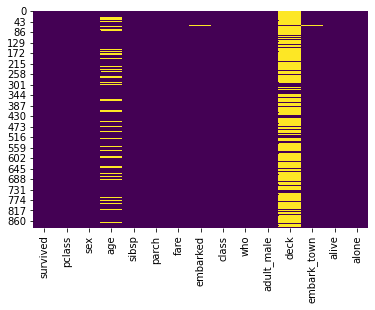

In [8]:
# If more than 50 % data is missing drop the column
sns.heatmap(titanic.isnull(), cbar=False,cmap='viridis')

In [9]:
 titanic['age'].isnull().sum()/titanic.shape[0]*100

19.865319865319865

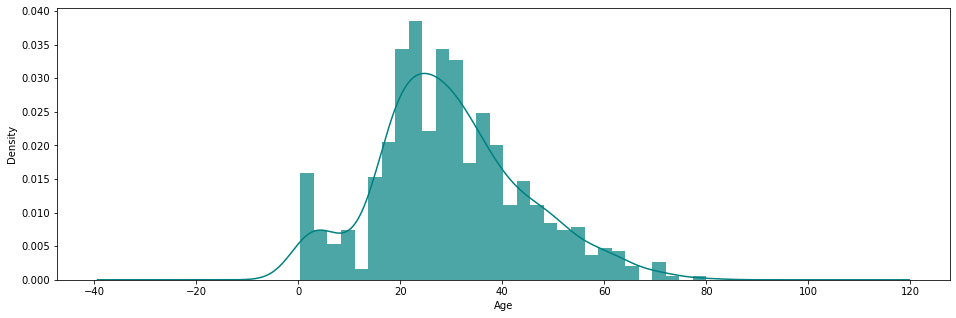

In [10]:
ax = titanic['age'].hist(bins = 30 ,density = True ,stacked = True, color='teal' , alpha = 0.7 , figsize=(16,5))
titanic['age'].plot(kind='density',color="teal")
ax.set_xlabel('Age')
plt.show()

Text(0.5, 1.0, 'Male')

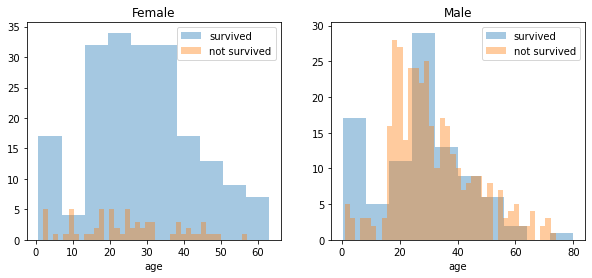

In [11]:
survived  = "survived"
not_survived = "not survived"

fig , axes = plt.subplots(nrows = 1 , ncols = 2, figsize=(10,4) )
women = titanic[titanic['sex'] == 'female']
men = titanic[titanic['sex'] == 'male']
 
ax = sns.distplot(women[women[survived]==1].age.dropna() , bins = 10 , label = survived , ax = axes[0] , kde = False)
ax = sns.distplot(women[women[survived]==0].age.dropna() , bins = 40 , label = not_survived , ax = axes[0] , kde = False)
ax.legend()
ax.set_title('Female')
 
ax = sns.distplot(men[men[survived]==1].age.dropna() , bins = 10 , label = survived , ax = axes[1] , kde = False)
ax = sns.distplot(men[men[survived]==0].age.dropna() , bins = 40 , label = not_survived , ax = axes[1] , kde = False)
ax.legend()
ax.set_title('Male')

In [12]:
 titanic['sex'].value_counts()

male      577
female    314
Name: sex, dtype: int64

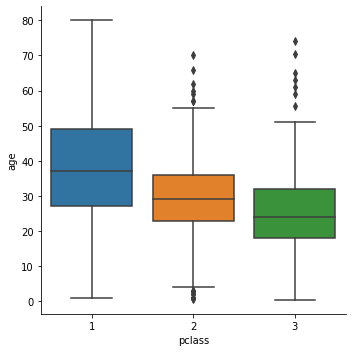

In [13]:
sns.catplot(x='pclass',y='age',data=titanic,kind='box')

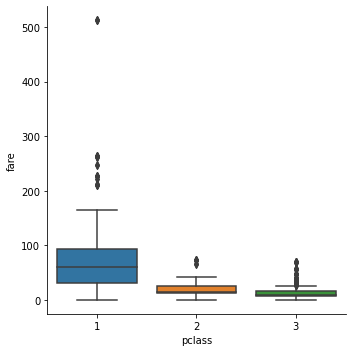

In [14]:
sns.catplot(x='pclass',y='fare',data=titanic,kind='box')

In [15]:
titanic[titanic['pclass'] == 1]['age'].mean()

38.233440860215055

In [16]:
titanic[titanic['pclass'] == 2]['age'].mean()

29.87763005780347

In [17]:
titanic[titanic['pclass'] == 3]['age'].mean()

25.14061971830986

In [18]:
def impute_age(cols):
    age=cols[0]
    pclass=cols[1]

    if pd.isnull(age):
        if pclass == 1:
            return titanic[titanic['pclass'] == 1]['age'].mean()
        elif pclass == 2:
            return titanic[titanic['pclass'] == 2]['age'].mean()
        elif pclass == 3:
            return titanic[titanic['pclass'] == 3]['age'].mean()
    else:
        return age

In [19]:
titanic['age'] = titanic[['age','pclass']].apply(impute_age,axis = 1)

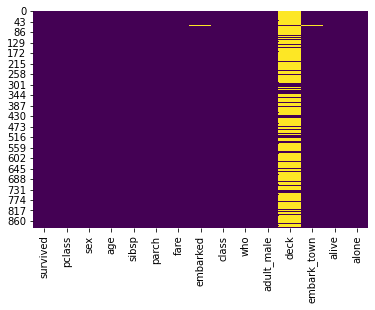

In [20]:
sns.heatmap(titanic.isnull(),cbar=False,cmap='viridis')

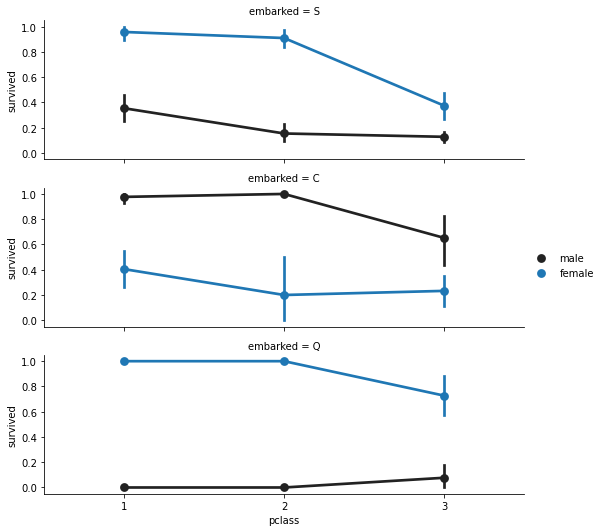

In [21]:
# Creating a FacetGrid
f = sns.FacetGrid(titanic,row = 'embarked',height=2.5,aspect=3)
f.map(sns.pointplot, 'pclass' , 'survived' , 'sex' , order = None , hue_order = None)
f.add_legend()

In [22]:
titanic.isnull().sum()

survived         0
pclass           0
sex              0
age              0
sibsp            0
parch            0
fare             0
embarked         2
class            0
who              0
adult_male       0
deck           688
embark_town      2
alive            0
alone            0
dtype: int64

In [23]:
titanic['embarked'].isnull().sum()

2

In [24]:
titanic['embark_town'].value_counts()

Southampton    644
Cherbourg      168
Queenstown      77
Name: embark_town, dtype: int64

In [25]:
common_value = 'S'
titanic['embarked'].fillna(common_value,inplace=True)

In [26]:
titanic['embarked'].isnull().sum()

0

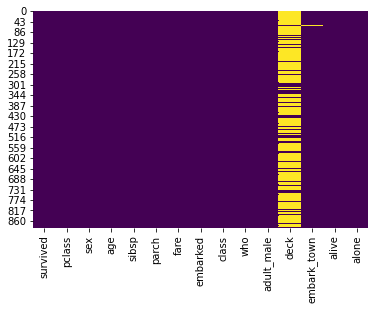

In [27]:
sns.heatmap(titanic.isnull(),cbar=False,cmap='viridis')

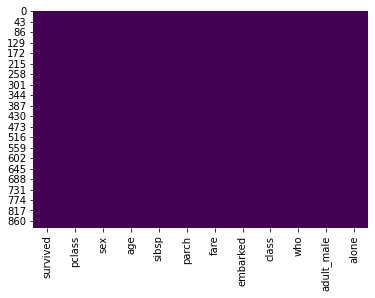

In [28]:
titanic.drop(labels=['deck','embark_town','alive'],inplace=True,axis = 1)
sns.heatmap(titanic.isnull(),cbar=False,cmap='viridis')

In [29]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   survived    891 non-null    int64   
 1   pclass      891 non-null    int64   
 2   sex         891 non-null    object  
 3   age         891 non-null    float64 
 4   sibsp       891 non-null    int64   
 5   parch       891 non-null    int64   
 6   fare        891 non-null    float64 
 7   embarked    891 non-null    object  
 8   class       891 non-null    category
 9   who         891 non-null    object  
 10  adult_male  891 non-null    bool    
 11  alone       891 non-null    bool    
dtypes: bool(2), category(1), float64(2), int64(4), object(3)
memory usage: 54.9+ KB


In [30]:
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,True


In [31]:
titanic['fare'] = titanic['fare'].astype('int')  # convert float to int could lead to data loss
titanic['age'] = titanic['age'].astype('int')
titanic['pclass'] = titanic['pclass'].astype('int')

titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   survived    891 non-null    int64   
 1   pclass      891 non-null    int32   
 2   sex         891 non-null    object  
 3   age         891 non-null    int32   
 4   sibsp       891 non-null    int64   
 5   parch       891 non-null    int64   
 6   fare        891 non-null    int32   
 7   embarked    891 non-null    object  
 8   class       891 non-null    category
 9   who         891 non-null    object  
 10  adult_male  891 non-null    bool    
 11  alone       891 non-null    bool    
dtypes: bool(2), category(1), int32(3), int64(3), object(3)
memory usage: 44.5+ KB


In [32]:
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,alone
0,0,3,male,22,1,0,7,S,Third,man,True,False
1,1,1,female,38,1,0,71,C,First,woman,False,False
2,1,3,female,26,0,0,7,S,Third,woman,False,True
3,1,1,female,35,1,0,53,S,First,woman,False,False
4,0,3,male,35,0,0,8,S,Third,man,True,True


In [33]:
# Convert Categorical Data into Numerical Data
genders = {'male': 0 , 'female' : 1}
titanic['sex'] = titanic['sex'].map(genders)

In [34]:
who = {'man' : 0 , 'woman' : 1 , 'child' : 2}
titanic['who'] = titanic['who'].map(who)
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,alone
0,0,3,0,22,1,0,7,S,Third,0,True,False
1,1,1,1,38,1,0,71,C,First,1,False,False
2,1,3,1,26,0,0,7,S,Third,1,False,True
3,1,1,1,35,1,0,53,S,First,1,False,False
4,0,3,0,35,0,0,8,S,Third,0,True,True


In [35]:
adult_male = {True: 1 , False : 0}
titanic['adult_male'] = titanic['adult_male'].map(adult_male)
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,alone
0,0,3,0,22,1,0,7,S,Third,0,1,False
1,1,1,1,38,1,0,71,C,First,1,0,False
2,1,3,1,26,0,0,7,S,Third,1,0,True
3,1,1,1,35,1,0,53,S,First,1,0,False
4,0,3,0,35,0,0,8,S,Third,0,1,True


In [36]:
alone = {True: 1 , False : 0}
titanic['alone'] = titanic['alone'].map(alone)
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,alone
0,0,3,0,22,1,0,7,S,Third,0,1,0
1,1,1,1,38,1,0,71,C,First,1,0,0
2,1,3,1,26,0,0,7,S,Third,1,0,1
3,1,1,1,35,1,0,53,S,First,1,0,0
4,0,3,0,35,0,0,8,S,Third,0,1,1


In [37]:
ports = {'S' : 0 , 'C' : 1 , 'Q' : 2}
titanic['embarked'] = titanic['embarked'].map(ports)
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,alone
0,0,3,0,22,1,0,7,0,Third,0,1,0
1,1,1,1,38,1,0,71,1,First,1,0,0
2,1,3,1,26,0,0,7,0,Third,1,0,1
3,1,1,1,35,1,0,53,0,First,1,0,0
4,0,3,0,35,0,0,8,0,Third,0,1,1


In [38]:
titanic.drop(labels=['class','who'],axis=1,inplace=True)
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,adult_male,alone
0,0,3,0,22,1,0,7,0,1,0
1,1,1,1,38,1,0,71,1,0,0
2,1,3,1,26,0,0,7,0,0,1
3,1,1,1,35,1,0,53,0,0,0
4,0,3,0,35,0,0,8,0,1,1


# Build Logistic Regression Model

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [40]:
X = titanic.drop('survived' , axis = 1)
y = titanic['survived']

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.33,random_state = 42)

In [41]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((596, 9), (295, 9), (596,), (295,))

In [42]:
model = LogisticRegression(solver = 'lbfgs' , max_iter = 200)
model.fit(X_train,y_train)
y_predict = model.predict(X_test)

In [43]:
y_predict.shape

(295,)

In [44]:
y_predict

array([0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 0], dtype=int64)

In [45]:
model.score(X_test,y_test)

0.8271186440677966

# Recursive Feature Elimination

In [46]:
from sklearn.feature_selection import RFE

In [53]:
model = LogisticRegression(solver = 'lbfgs' , max_iter=500)
rfe = RFE(model,5,verbose=1)
rfe = rfe.fit(X,y)

Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.


In [54]:
X.shape

(891, 9)

In [55]:
rfe.support_

array([ True, False, False,  True,  True, False, False,  True,  True])

In [56]:
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,adult_male,alone
0,0,3,0,22,1,0,7,0,1,0
1,1,1,1,38,1,0,71,1,0,0
2,1,3,1,26,0,0,7,0,0,1
3,1,1,1,35,1,0,53,0,0,0
4,0,3,0,35,0,0,8,0,1,1


In [57]:
X.head()

,pclass,sex,age,sibsp,parch,fare,embarked,adult_male,alone
0,3,0,22,1,0,7,0,1,0
1,1,1,38,1,0,71,1,0,0
2,3,1,26,0,0,7,0,0,1
3,1,1,35,1,0,53,0,0,0
4,3,0,35,0,0,8,0,1,1


In [58]:
XX = X[X.columns[rfe.support_]]
XX.head()

,pclass,sibsp,parch,adult_male,alone
0,3,1,0,1,0
1,1,1,0,0,0
2,3,0,0,0,1
3,1,1,0,0,0
4,3,0,0,1,1


In [61]:
X_train,X_test,y_train,y_test = train_test_split(XX,y,test_size=0.2,random_state = 8,stratify =y)

print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

model = LogisticRegression(solver = 'lbfgs' , max_iter = 500)
model.fit(X_train,y_train)
y_predict = model.predict(X_test)

model.score(X_test,y_test)

(712, 5) (179, 5) (712,) (179,)


0.8547486033519553

# Accuracy,F1-SCore,P,R,AUC_ROC Curve

In [62]:
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score
from sklearn.metrics import confusion_matrix,precision_recall_curve,roc_auc_score,roc_curve,auc,log_loss


In [63]:
X_train,X_test,y_train,y_test = train_test_split(XX,y,test_size=0.2,random_state = 8,stratify =y)

print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

model = LogisticRegression(solver = 'lbfgs' , max_iter = 500)
model.fit(X_train,y_train)
y_predict = model.predict(X_test)

model.score(X_test,y_test)

(712, 5) (179, 5) (712,) (179,)


0.8547486033519553

In [70]:
y_predict_prob = model.predict_proba(X_test)[:,1]
y_predict_prob

array([0.55566832, 0.87213996, 0.09376084, 0.09376084, 0.37996908,
       0.68892605, 0.20115074, 0.09376084, 0.03049173, 0.20115074,
       0.20115074, 0.84350496, 0.09376084, 0.20115074, 0.91838728,
       0.82218121, 0.61279411, 0.61279411, 0.91838728, 0.82218121,
       0.06376194, 0.13241896, 0.20115074, 0.09376084, 0.65515066,
       0.41670031, 0.84350496, 0.09376084, 0.09376084, 0.90360595,
       0.47480594, 0.09376084, 0.92916807, 0.90360595, 0.37996908,
       0.09376084, 0.09376084, 0.0219807 , 0.16917754, 0.09376084,
       0.09376084, 0.09376084, 0.68892605, 0.37996908, 0.09376084,
       0.09376084, 0.10762723, 0.65515066, 0.94318445, 0.91838728,
       0.09376084, 0.09376084, 0.37996908, 0.37996908, 0.22692227,
       0.65515066, 0.94318445, 0.91838728, 0.33796755, 0.20115074,
       0.10762723, 0.22692227, 0.65515066, 0.09376084, 0.9222574 ,
       0.09376084, 0.20115074, 0.10762723, 0.9222574 , 0.92916807,
       0.94318445, 0.09376084, 0.61279411, 0.65515066, 0.33796

In [78]:
[fpr,tpr ,thr] = roc_curve(y_test,y_pred_prob)
print("Accuracy",accuracy_score(y_test,y_predict))
print("Log Loss",log_loss(y_test,y_predict_prob))
print("AUC",auc(fpr,tpr))

Accuracy 0.8547486033519553
Log Loss 0.36597373727139876
AUC 0.9007246376811595


In [79]:
idx = np.min(np.where(tpr>0.95))
idx

27

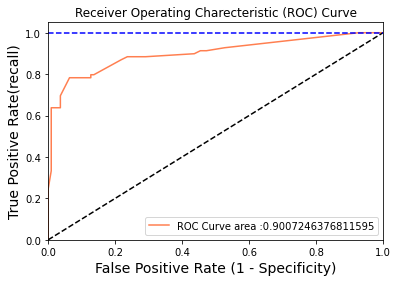

Using a threshold pf 0.094 gurantees a sensitivity of 1.000and a specificity of 0.073 , i.e a false positive rate of 92.73%


In [84]:
plt.figure()
plt.plot(fpr,tpr,color='coral',label="ROC Curve area :" + str(auc(fpr,tpr)))
plt.plot([0,1],[0,1],'k--')
plt.plot(0,fpr[idx],[tpr[idx],tpr[idx]],'k--',color='blue')

plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate (1 - Specificity)",fontsize=14)
plt.ylabel("True Positive Rate(recall)",fontsize=14)
plt.title("Receiver Operating Charecteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

print("Using a threshold pf %.3f " % thr[idx] + "gurantees a sensitivity of %.3f" %tpr[idx]
+ "and a specificity of %.3f" % (1 - fpr[idx]) + " , i.e a false positive rate of %.2f%%" %(np.array(fpr[idx])*100))